# First Steps Into the Project
    - Reading the tabular data
    - Reading the raster file and the information it contains
    - Displaying the tiles on the raster file 

### Setting working directory

In [1]:
import os
os.chdir('../')

### Modules and Libraries Needed

In [2]:
from Pipelines.process_raw import analytical_table, target, columns_description, land_cover_map, shapefile
import pandas as pd
import numpy as np
import rasterio as rio
import geopandas as gpd
import earthpy as et
from rasterio.plot import show
import gdal
import matplotlib.pyplot as plt
import fiona
import georasters as gr
import earthpy.plot as ep
from rasterio.plot import plotting_extent
import rasterstats as rs
from rasterio.plot import show
import plotly.graph_objects as go
import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()

## Tabular Data

In [4]:
analytical_table.head()

,block_size,tile_h,tile_v,empty_area,water_area,urban_area,barren_area,forest_area,shrubland_area,herbaceous_area,...,protected_area_taa,elevation,elevation_sd,elevation_min,elevation_max,degree_of_slope,degree_of_slope_sd,degree_of_slope_min,degree_of_slope_max,has_target
0,33,5412,0,1016,73,0,0,0,0,0,...,0,0,0.0,0,0,0,0.0,0,0,0
1,33,5445,0,654,435,0,0,0,0,0,...,0,0,0.0,0,0,0,0.0,0,0,0
2,33,5478,0,259,526,0,2,294,0,8,...,0,0,0.0,0,0,0,0.0,0,0,1
3,33,5511,0,81,840,0,13,146,0,2,...,0,0,0.0,0,0,0,0.0,0,0,1
4,33,5544,0,317,772,0,0,0,0,0,...,0,0,0.0,0,0,0,0.0,0,0,1


In [6]:
print("The total number of tiles on the state of Wisconsin is {0}".format(len(analytical_table)))

The total number of tiles on the state of Wisconsin is 149751


In [49]:
target.head()

,tile_h,tile_v,target
0,5478,0,0
1,5511,0,0
2,5544,0,0
3,5313,33,0
4,5478,33,0


In [7]:
print("We have a target for {0} of these tiles".format(len(target)))

We have a target for 104836 of these tiles


In [9]:
columns_description

,column_name,column_description
0,block_size,Number of pixels on each side of the tile
1,tile_width,Horizontal coordinate of the bottom left corne...
2,tile_height,Vertical coordinate of the bottom left corner ...
3,empty_area,Number of pixels with no land cover value in t...
4,water_area,Number of pixels that correspond to land_cover...
5,urban_area,Number of pixels that correspond to land_cover...
6,barren_area,Number of pixels that correspond to land_cover...
7,forest_area,Number of pixels that correspond to land_cover...
8,shrubland_area,Number of pixels that correspond to land_cover...
9,herbaceous_area,Number of pixels that correspond to land_cover...


    Some information (especially on elevation and slope of the land) appears on the tabular data but is not on the raster file 
    Let's visualize that data using the shapefile 

### Shapefile

In [6]:
shapefile.head()

,tile_h,tile_v,geometry
0,0,5214,"POLYGON ((243675.000 2527815.000, 242685.000 2..."
1,0,5247,"POLYGON ((243675.000 2526825.000, 242685.000 2..."
2,0,5280,"POLYGON ((243675.000 2525835.000, 242685.000 2..."
3,0,5313,"POLYGON ((243675.000 2524845.000, 242685.000 2..."
4,0,5346,"POLYGON ((243675.000 2523855.000, 242685.000 2..."


<AxesSubplot:>

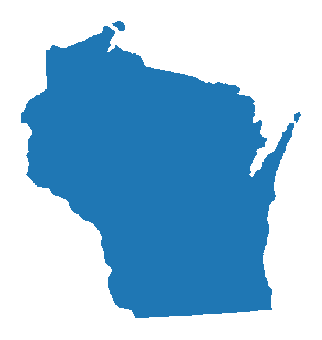

In [19]:
fig, ax = plt.subplots(1, figsize=(10, 6))
ax.axis('off')
shapefile.plot(ax = ax)

    We merge the data of interest to the shapefile from the analytical table using the primary key [tile_h, tile_v]

In [13]:
geo_analytical_table = shapefile.merge(analytical_table, how = 'inner', on = ['tile_h', 'tile_v'])

<AxesSubplot:title={'center':'Target Availability'}>

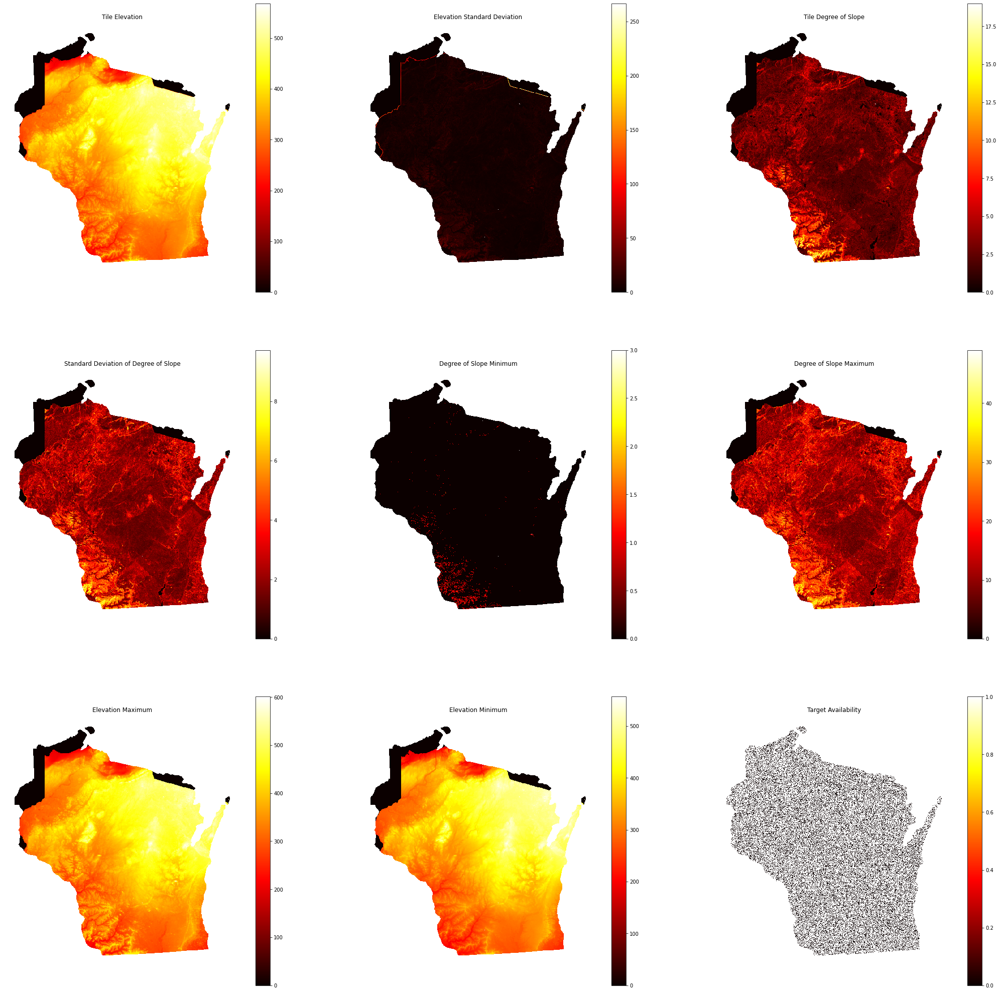

In [28]:
fig, axs = plt.subplots(3,3, figsize=(36,36))
axs[0,0].axis('off')
axs[0,0].set_title('Tile Elevation')
geo_analytical_table.plot(column = 'elevation', ax = axs[0,0], cmap = 'hot', legend=True)
axs[0,1].axis('off')
axs[0,1].set_title('Elevation Standard Deviation')
geo_analytical_table.plot(column = 'elevation_sd', ax = axs[0,1], cmap = 'hot', legend=True)
axs[0,2].axis('off')
axs[0,2].set_title('Tile Degree of Slope')
geo_analytical_table.plot(column = 'degree_of_slope', ax = axs[0,2], cmap = 'hot', legend=True)
axs[1,0].axis('off')
axs[1,0].set_title('Standard Deviation of Degree of Slope')
geo_analytical_table.plot(column = 'degree_of_slope_sd', ax = axs[1,0], cmap = 'hot', legend=True)
axs[1,1].axis('off')
axs[1,1].set_title('Degree of Slope Minimum')
geo_analytical_table.plot(column = 'degree_of_slope_min', ax = axs[1,1], cmap = 'hot', legend=True)
axs[1,2].axis('off')
axs[1,2].set_title('Degree of Slope Maximum')
geo_analytical_table.plot(column = 'degree_of_slope_max', ax = axs[1,2], cmap = 'hot', legend=True)
axs[2,0].axis('off')
axs[2,0].set_title('Elevation Maximum')
geo_analytical_table.plot(column = 'elevation_max', ax = axs[2,0], cmap = 'hot', legend=True)
axs[2,1].axis('off')
axs[2,1].set_title('Elevation Minimum')
geo_analytical_table.plot(column = 'elevation_min', ax = axs[2,1], cmap = 'hot', legend=True)
axs[2,2].axis('off')
axs[2,2].set_title('Target Availability')
geo_analytical_table.plot(column = 'has_target', ax = axs[2,2], cmap = 'hot', legend=True)

In [7]:
landcover_map

,pixel_value,land_cover_name
0,11,open_water
1,12,perennial_ice_or_snow
2,21,developed_open_space
3,22,developed_low_intensity
4,23,developed_medium_intensity
5,24,developed_high_intensity
6,31,barren_land_rock_sand_clay
7,41,deciduous_forest
8,42,evergreen_forest
9,43,mixed_forest


## Raster File

### Properties of the Raster File

In [79]:
raster = gdal.Open(RASTER)

# Dimensions
print("This image has {0} on the x-axis and {1} on the y-axis for total image resolutio of {2}p".format(raster.RasterXSize,
                                                                                                         raster.RasterYSize,
                                                                                                         raster.RasterYSize*raster.RasterYSize))
# Number of bands
print("It is a {0}-band raster".format(raster.RasterCount))
      
band1 = raster.GetRasterBand(1)
band2 = raster.GetRasterBand(2)

This image has 15857 on the x-axis and 16837 on the y-axis for total image resolutio of 283484569p
It is a 2-band raster


### 2-Band Raster 
    In displaying the two bands, we can see that Band1 gives us the landcover code while Band2 is just an indicator if the pixel is on the state or outside of it

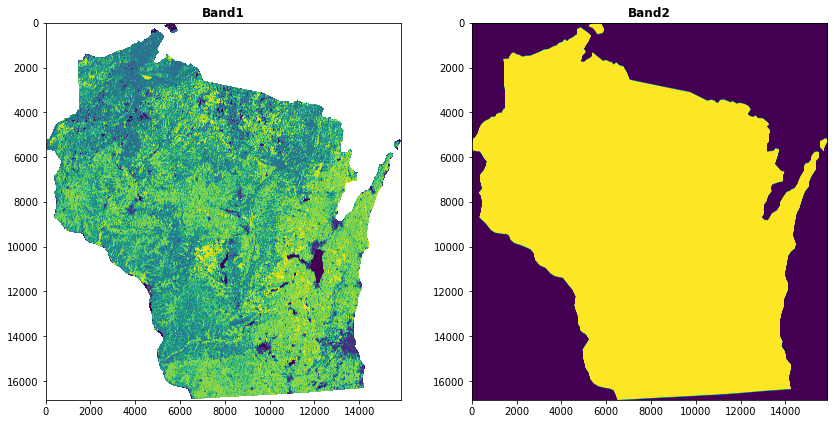

In [20]:
with rio.open(RASTER) as DEM_src:
    fig, (axr, axg) = plt.subplots(1,2, figsize=(14,7))
    show(DEM_src.read(1, masked=True), ax = axr, title = 'Band1')
    show(DEM_src.read(2, masked=True), ax = axg, title = 'Band2')

We can also see that the origin of the file is at the top left corner

### Let's take a closer look at Band1
    Band1 contains the data we need since the tiles always encompass at least some "instate pixels", let us join it with "landcover_map" to look at the spatial distribution of land types across the state

In [17]:
with rio.open(RASTER) as DEM_src:
    DEM_data = DEM_src.read(1, masked=False)
    counts = DEM_data.ravel()
    unique, counts = np.unique(counts, return_counts=True)
    unique = [landcover_map.loc[landcover_map['pixel_value'] == u ,['land_cover_name']].values[0][0] if u != 0 else "Na" for u in unique]
    dist = dict(zip(unique, counts))
    del dist['Na']
    dist = {k: v for k, v in sorted(dist.items(), key=lambda item: item[1], reverse=True)}
    x = list(dist.keys())
    y = list(dist.values())
    
    fig = go.Figure(data=[go.Bar(
                x=x, y=y,
                text=y,
                textposition='auto',
            )])
    fig.update_layout(title_text='Land cover type distribution in Wisconsin in 2001')


    fig.show()

### How do the tiles cover the state ?
    This is a supervised learning problem and our observations are the tiles covering the state. Let us plot these tiles on top of the raster file for visualisation purposes. For each blue square that doesn't have a target we will have to predict how many pixels will belong to one of these 4 categories in 2016:
        - developed_open_space
        - developed_low_intensity
        - developed_medium_intensity
        - developed_high_intensity

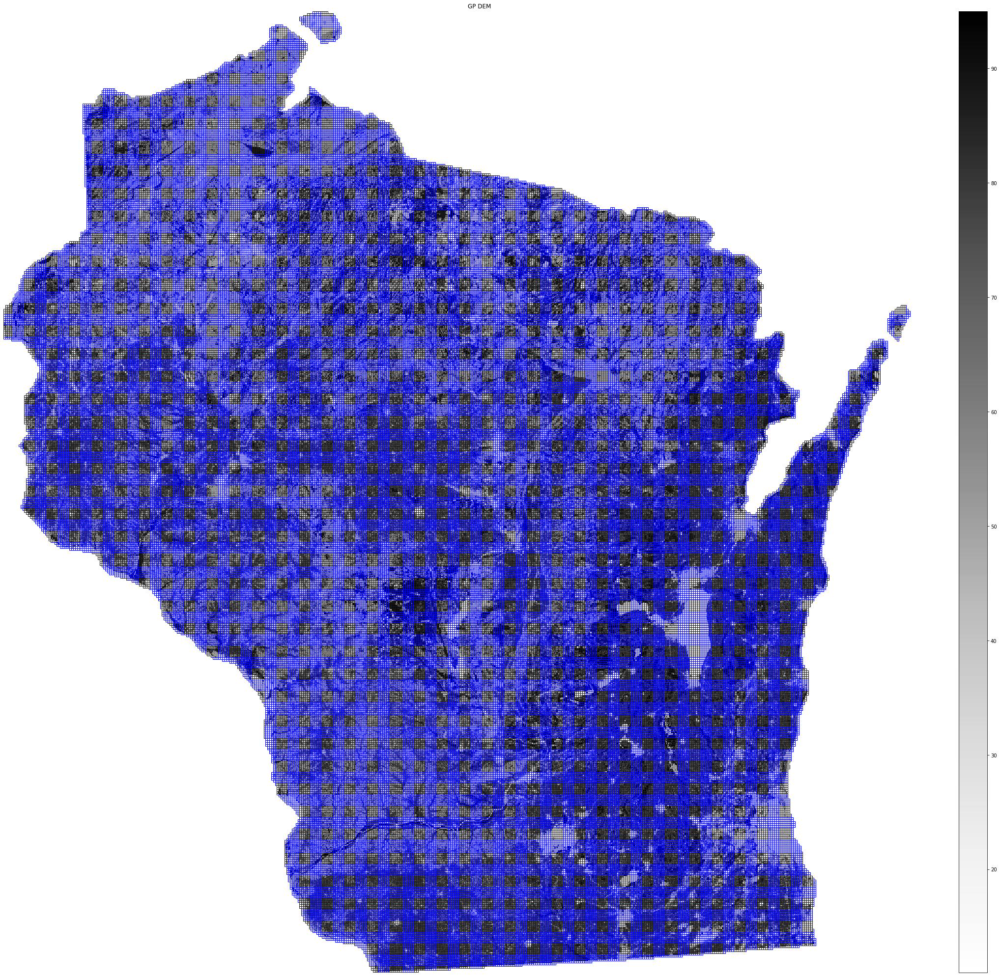

In [152]:
county_BD= gpd.GeoDataFrame.from_file(SHAPEFILE)
county_BD.geom_type.head()

fig, ax = plt.subplots(figsize=(36, 36))

ep.plot_bands(DEM_data,
              extent=plotting_extent(DEM_src),
              cmap='Greys',
              title="GP DEM",
              scale=True,
              ax=ax)
county_BD.plot(ax=ax,
               edgecolor='blue',
              facecolor='none')
ax.set_axis_off()
plt.show()